### UFMG <br> 2023.1 <br> Machine Learning
***
Trabalho Final<br>
Diego Tomaz<br>

Este trabalho visa criar um **`sistema de detecção de veículos`** (**traseira e lateral** de veículos). Em um contexto da vida real, imaginemos que há uma rua em que o trafego de veículos é proibido e, portanto, há necessidade de se fiscalizar se tal regra é respeitada e aplicar as medidas cabíveis. 

Nesse sentido, podemos exemplificar esse trecho da `Rua Rio de Janeiro`, no centro de Belo Horizonte, em que habitualmente há fluxo apenas de pedestres mas que, em um cenário hipotético, poderia haver fiscalização automática do trânsito de veículos.

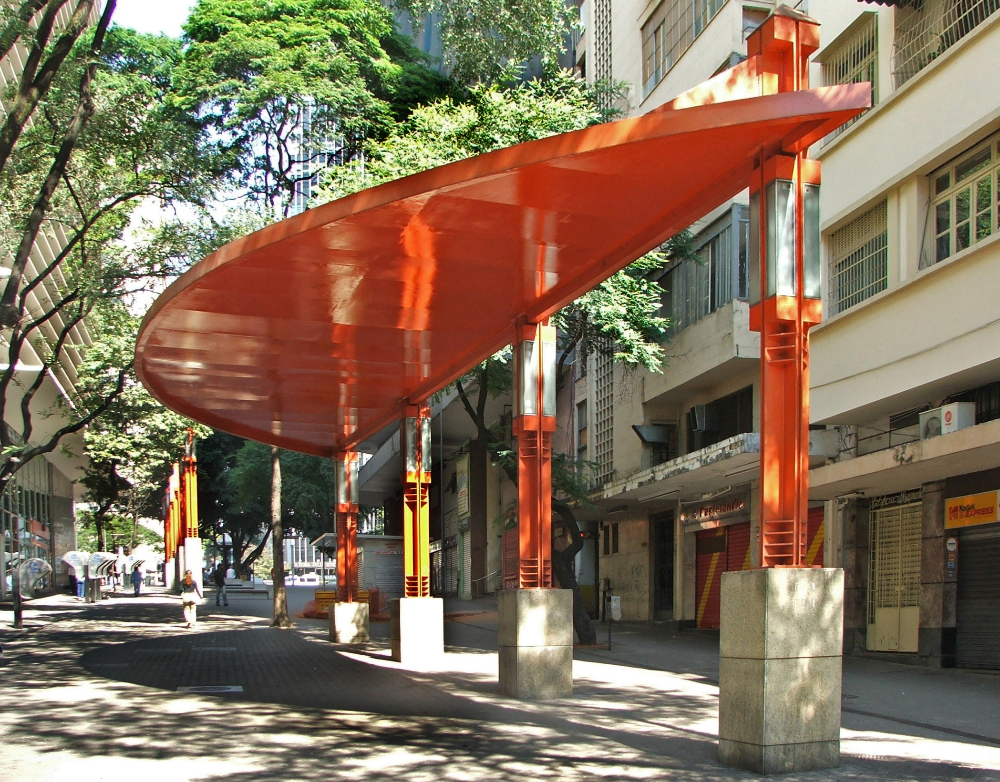

Para tal, utilizei o dataset disponibilizado pela Universidade Politécnica de Madrid (https://www.gti.ssr.upm.es/data/Vehicle_database.html). O algoritmo escolhido para atingir o objetivo desse projeto é baseado em **`deep learning`** e, mais especificamente, emprega uma arquitetura de **`Rede Neural Convolucional`**.

As Redes Neurais Convolucionais são um `subconjunto` dos algoritmos de aprendizado de máquina que se mostram particularmente eficientes para tarefas de processamento de imagem e reconhecimento de padrões, o que é o caso.

Sua eficácia é explicada pela capacidade de aprender automaticamente hierarquias de características abstratas a partir dos dados de entrada. As `camadas inferiores das CNNs` geralmente aprendem a detectar recursos de baixo nível, como `bordas e cores`, enquanto as `camadas superiores` combinam esses recursos para identificar padrões mais complexos, como `formas ou objetos`.

In [1]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import load_model

2023-07-05 22:01:17.422235: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-07-05 22:01:17.862441: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-07-05 22:01:17.864814: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-05 22:01:19.662562: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
# Carrega imagens e atribui rótulos
def load_images_and_labels(directory, label):
    images = []
    labels = []
    subfolders = [f.path for f in os.scandir(directory) if f.is_dir()]
    for folder in subfolders:
        for filename in os.listdir(folder):
            if filename.endswith(".jpg") or filename.endswith(".png"):
                # Redimensionando as imagens para o tamanho desejado e convertendo para array
                img = load_img(os.path.join(folder, filename), target_size=image_size)
                img_array = img_to_array(img) / 255.0  # Normalizando os dados de imagem para o intervalo [0,1]
                images.append(img_array)
                labels.append(label)
    return images, labels

In [3]:
# Diretórios
vehicle_dir = './train/vehicles'
non_vehicle_dir = './train/non-vehicles'
image_size = (64, 64)  # Definindo o tamanho da imagem para 64x64 pixels [default do dataset]

In [4]:
# Carrega as imagens e rótulos para veículos e não veículos
vehicle_images, vehicle_labels = load_images_and_labels(vehicle_dir, 1)  # rótulo '1' para veículos
non_vehicle_images, non_vehicle_labels = load_images_and_labels(non_vehicle_dir, 0)  # rótulo '0' para não veículos

In [5]:
# Concatena imagens + rótulos de veículos e não veículos
images = np.concatenate([vehicle_images, non_vehicle_images])
labels = np.concatenate([vehicle_labels, non_vehicle_labels])

In [6]:
# Divide os dados em conjuntos de treinamento, validação e teste
train_images, temp_images, train_labels, temp_labels = train_test_split(images, labels, test_size=0.3, random_state=42)
val_images, test_images, val_labels, test_labels = train_test_split(temp_images, temp_labels, test_size=0.5, random_state=42)


A função Sequential() cria um modelo sequencial, ou seja, um modelo que é composto por uma pilha linear de camadas.

**`Conv2D(32, (3, 3), input_shape=(64, 64, 3))`** adiciona a `primeira camada convolucional` ao modelo, basicamente tem por objetivo extrair características básicas das imagens.

**`Activation('relu')`** aplica a `função de ativação ReLU`.

**`MaxPooling2D(pool_size=(2, 2))`** adiciona uma `camada de pooling`, a fim de `prevenir o overfitting` e reduzir o tempo de computação.

**`Conv2D(32, (3, 3)) e Conv2D(64, (3, 3))`** adicionam a `segunda e a terceira camadas convolucionais`, respectivamente, seguidas por ativações ReLU e camadas de MaxPooling. Quanto maior o filtro em camadas profundas, maior `tende` a ser a aprendizagem.

**`Flatten()`** achata a saída 3D para um vetor 1D.

**`Dense(64)`** adiciona uma `camada densa`.

**`Dropout(0.5)`** aplica a `regularização Dropout`, onde aleatoriamente 50% dos neurônios na camada são "desligados" durante o treinamento a fim de, também, `previnir o overfiting`.

**`Dense(1)`** Por ser um problema de classificação binária (Ou é veículo ou não é), há apenas um neurônio na camada de saída.

**`Activation('sigmoid')`** aplica a `função de ativação sigmoid` à saída, que transforma a saída em uma probabilidade entre 0 e 1, `quanto mais próximo de 1 maior a probabilidade de ser um veículo`.

In [7]:
# Definição da arquitetura do modelo de rede neural convolucional
model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=(64, 64, 3)))
model.add(Activation('relu'))  
model.add(MaxPooling2D(pool_size=(2, 2))) 

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu')) 
model.add(MaxPooling2D(pool_size=(2, 2))) 

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64)) 
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(1))
model.add(Activation('sigmoid'))

In [8]:
# Compila o modelo com a perda de entropia cruzada binária e otimizador Adam
model.compile(optimizer=Adam(),
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])

Basicamente, os valores que melhor se saíram nos testes foram de 7-12 épocas. O batch foi testado em 32 e e fui reduzindo-o até chegar no valor que gerou um modelo satisfatório ao final, que no caso foi 15.

In [9]:
# Treina o modelo e salva o histórico de treinamento
epochs = 9

history = model.fit(
    train_images, 
    train_labels, 
    validation_data=(val_images, val_labels), 
    batch_size=15, 
    epochs=epochs
)

Epoch 1/9


2023-07-05 22:01:29.605542: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 252002304 exceeds 10% of free system memory.


342/342 [==============================] - 12s 31ms/step - loss: 0.3243 - accuracy: 0.8625 - val_loss: 0.1463 - val_accuracy: 0.9481
Epoch 2/9
342/342 [==============================] - 11s 31ms/step - loss: 0.1485 - accuracy: 0.9475 - val_loss: 0.1059 - val_accuracy: 0.9718
Epoch 3/9
342/342 [==============================] - 10s 30ms/step - loss: 0.1022 - accuracy: 0.9641 - val_loss: 0.0811 - val_accuracy: 0.9763
Epoch 4/9
342/342 [==============================] - 10s 30ms/step - loss: 0.0817 - accuracy: 0.9713 - val_loss: 0.0788 - val_accuracy: 0.9745
Epoch 5/9
342/342 [==============================] - 10s 30ms/step - loss: 0.0672 - accuracy: 0.9783 - val_loss: 0.0628 - val_accuracy: 0.9782
Epoch 6/9
342/342 [==============================] - 10s 30ms/step - loss: 0.0515 - accuracy: 0.9823 - val_loss: 0.0714 - val_accuracy: 0.9736
Epoch 7/9
342/342 [==============================] - 11s 32ms/step - loss: 0.0488 - accuracy: 0.9815 - val_loss: 0.0820 - val_accuracy: 0.9800
Epoch 8/9

In [10]:
model.save('modelo.h5')

In [11]:
# Avalia o modelo
test_loss, test_acc = model.evaluate(test_images, test_labels, verbose=2)
print('\nTest accuracy:', test_acc)

35/35 - 0s - loss: 0.0811 - accuracy: 0.9782 - 442ms/epoch - 13ms/step

Test accuracy: 0.9781619906425476


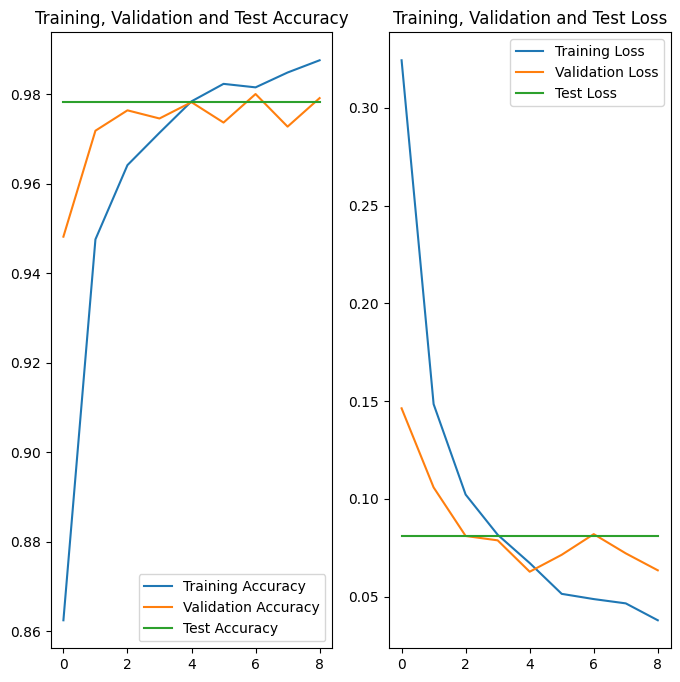

In [12]:
# Recupera as métricas do histórico de treinamento
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# Adiciona as métricas de teste
test_acc_list = [test_acc] * len(acc)
test_loss_list = [test_loss] * len(loss)

epochs_range = range(epochs)

# Plota os gráficos
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.plot(epochs_range, test_acc_list, label='Test Accuracy')
plt.legend(loc='lower right')
plt.title('Training, Validation and Test Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.plot(epochs_range, test_loss_list, label='Test Loss')
plt.legend(loc='upper right')
plt.title('Training, Validation and Test Loss')
plt.show()


In [15]:
model = load_model('modelo.h5')

cap = cv2.VideoCapture('camera.mp4')

# Período do vídeo arbitrário para teste
fps = cap.get(cv2.CAP_PROP_FPS)
start_frame = int(1 * 60 + 35 * fps)  # Começa em 1:35
end_frame = int(1 * 60 + 40 * fps)  # Termina em 1:40

cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)

fourcc = cv2.VideoWriter_fourcc(*'MP4V')  # ou use 'XVID'
out = cv2.VideoWriter('output.mp4', fourcc, fps, (int(cap.get(3)), int(cap.get(4))))

# Loop pelos quadros do segmento de vídeo
for _ in range(end_frame - start_frame):
    # Captura o quadro
    ret, frame = cap.read()
    if not ret:
        break

    frame_rectangle = frame.copy()

    for y in range(0, frame.shape[0], 64):
        for x in range(0, frame.shape[1], 64):
            img = frame[y:y+64, x:x+64]
            if img.shape[0] != 64 or img.shape[1] != 64:
                continue  # Se a imagem não for 64x64, pule
            img_array = img_to_array(img) / 255.0  # Normalizando os dados de imagem
            img_array = np.expand_dims(img_array, axis=0) 
            prediction = model.predict(img_array)
            if prediction > 0.93:  # Probabilidade de ser um carro >= 93%
                cv2.rectangle(frame_rectangle, (x, y), (x+64, y+64), (0, 255, 0), 2)

    # Grava o frame no novo arquivo de vídeo
    out.write(frame_rectangle)

cap.release()
out.release()


1/1 [==============================] - 0s 103ms/step


OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 20ms/step
